# Density and velocity profiles from PREM

# Profils de densité et de vitesses sismiques à partir du modèle PREM


Based on/Basé sur: Dziewonski, A. M., & Anderson, D. L. (1981). Preliminary reference Earth model. Physics of the earth and planetary interiors, 25(4), 297-356. 

code: M. Lasbleis

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# this is a small piece of code where all the functions for PREM are implemented (frequency: 1s, same as in Table 1)
# Petit script python avec l'implémentation des fonctions pour toutes les épaisseurs de PREM, pour une fréquence de 1s (Table 1)
import prem 

language = "fr" # other option is English

## First PREM based on the full table available in the paper

## Tout d'abord, PREM basé sur la table totale 

The file is available on the IRIS website (Incorporated Research Institutions for Seismology):

Le fichier est disponible sur IRIS (Incorporated Research Institutions for Seismology):

http://ds.iris.edu/files/products/emc/data/PREM/PREM_1s.csv


In [5]:
filename = "PREM_1s.csv"

PREM = pd.read_csv(filename, names =["radius","depth","density","Vpv","Vph","Vsv","Vsh","eta","Q-mu","Q-kappa"])

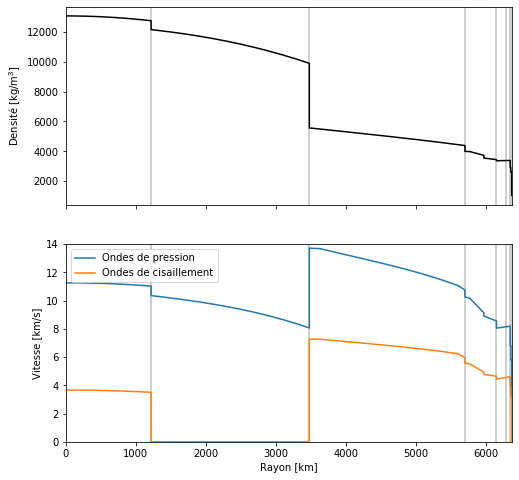

In [4]:
fig, ax = plt.subplots(2, 1, figsize=[8,8], sharex=True)

IC = 1221.5
OC = 3480.
LM = 5701
TZ = 6151
LVZ = 6291
LID = 6346.6
CR = 6368

limits = [IC, OC, LM, TZ, LVZ, LID, CR]
for lim in limits:
    ax[0].axvline(lim, alpha=0.5, color="grey")
    ax[1].axvline(lim, alpha=0.5, color="grey")

if language == "fr":
    ax[0].plot(PREM["radius"], PREM["density"]*1000,'k',  label="Densité")
    ax[1].plot(PREM["radius"], PREM["Vph"], label="Ondes de pression")
    ax[1].plot(PREM["radius"], PREM["Vsh"], label="Ondes de cisaillement")
elif language == "en":
    ax[0].plot(PREM["radius"], PREM["density"]*1000,'k',  label="Density")
    ax[1].plot(PREM["radius"], PREM["Vph"], label="P waves")
    ax[1].plot(PREM["radius"], PREM["Vsh"], label="S waves")
else:
    print("Please choose between French and English.")

#ax[0].legend()
ax[1].legend()
ax[1].set_xlim([0, 6371])
ax[1].set_ylim([0, 14])
if language == "fr":
    ax[0].set_ylabel("Densité [kg/m$^3$]")
    ax[1].set_ylabel("Vitesse [km/s]")
    ax[1].set_xlabel("Rayon [km]")
elif language == "en":
    ax[0].set_ylabel("Density [kg/m$^3$]")
    ax[1].set_ylabel("Veocity [km/s]")
    ax[1].set_xlabel("Radius [km]")
plt.savefig("PREM_"+language+".png")

In [6]:


density = np.vectorize(prem.density)
Vp = np.vectorize(prem.Vp)
Vs = np.vectorize(prem.Vs)

In [7]:
N=1000
x, y = np.linspace(-1.2,1.2,N), np.linspace(-1.2,1.2,N)
X, Y = np.meshgrid(x, y)
density = np.zeros_like(X)

for i, x_i in enumerate(x):
    for j, y_j in enumerate(y):
        radius = np.sqrt(x_i**2+y_j**2)
        if radius <1:
            density[i,j] = prem.density(radius)

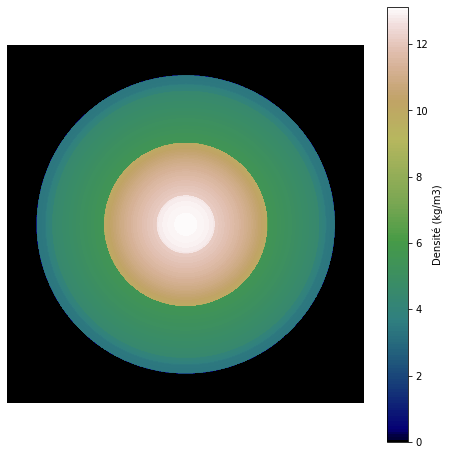

In [9]:
fig, ax = plt.subplots(figsize=[8,8])

sc = ax.contourf(X, Y, density, 200, cmap='gist_earth')
bar = fig.colorbar(sc, ticks=[0,2,4,6,8,10,12])
ax.axis('equal')
bar.set_label("Densité (kg/m3)")
plt.axis('off')
plt.savefig("PREM_circle.png")

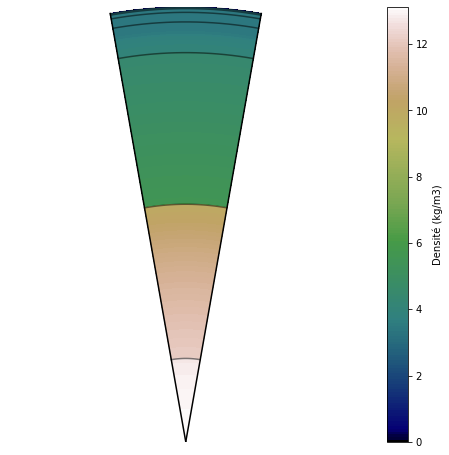

In [32]:
theta = np.linspace(80, 100, 20)
radius = np.linspace(0, 1, 500)
T, R = np.meshgrid(theta, radius)

X = R*np.cos(T*np.pi/180)
Y = R*np.sin(T*np.pi/180)

density = np.zeros_like(X)


for i, x_i in enumerate(theta):
    for j, y_j in enumerate(radius):
        if R[j,i] <1:
            density[j,i] = prem.density(R[j,i])

fig, ax = plt.subplots(figsize=[8,8])

sc = ax.contourf(X, Y, density, 200, cmap='gist_earth')
bar = fig.colorbar(sc, ticks=[0,2,4,6,8,10,12])
ax.axis('equal')
bar.set_label("Densité (kg/m3)")
plt.axis('off')
#plt.savefig("PREM_circle.png")

plt.plot([0, np.cos(80*np.pi/180)], [0, np.sin(80*np.pi/180)], 'k')
plt.plot([0, np.cos(100*np.pi/180)], [0, np.sin(100*np.pi/180)], 'k')

def draw_circle(ax, radius):
    theta = np.linspace(80, 100, 20)
    X = radius*np.cos(theta*np.pi/180)
    Y = radius*np.sin(theta*np.pi/180)
    ax.plot(X, Y, 'k', alpha=0.5)

IC = 1221.5
OC = 3480.
LM = 5701
TZ = 6151
LVZ = 6291
LID = 6346.6
CR = 6368

limits = [IC, OC, LM, TZ, LVZ, LID, CR]
for lim in limits:
    draw_circle(ax, lim/6371)

plt.savefig("coupe.pdf")

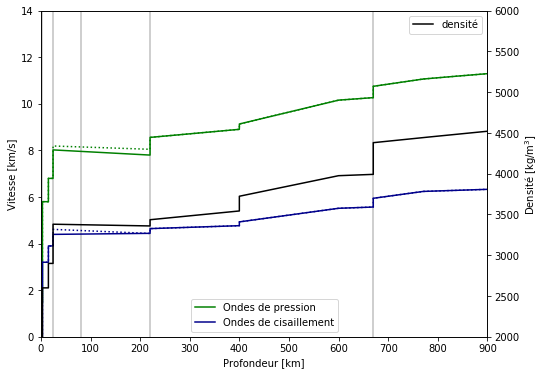

In [47]:
fig, ax = plt.subplots(figsize=[8,6], sharex=True)


IC = 1221.5
OC = 3480.
LM = 5701
TZ = 6151
LVZ = 6291
LID = 6346.6
CR = 6368

limits = [IC, OC, LM, TZ, LVZ, LID, CR]
for lim in limits:
    ax.axvline(6371-lim, alpha=0.5, color="grey")

ax.plot(PREM["depth"], PREM["Vph"],":g")
ax.plot(PREM["depth"], PREM["Vpv"],"g", label="Ondes de pression")
ax.plot(PREM["depth"], PREM["Vsh"],":", color="darkblue")
ax.plot(PREM["depth"], PREM["Vsv"],"darkblue", label="Ondes de cisaillement")
ax2=ax.twinx()
ax2.plot(PREM["depth"], PREM["density"]*1000,'k',  label="densité")
ax2.legend()

ax.legend()
ax.set_xlim([0, 900])
ax.set_ylim([0, 14])
ax2.set_ylim([2000, 6000])
ax2.set_ylabel("Densité [kg/m$^3$]")
ax.set_ylabel("Vitesse [km/s]")
ax.set_xlabel("Profondeur [km]")
plt.savefig("PREM_manteau_sup.png")